Data from Trevino et al. (Trevino_REF) was obtained from GSE162170.

We used cell-cycle phase associated genes from (REGEV_REF) to score and classify the cell-cycle phase in each cell.

We retained cells with less than 10% of mithocondrial counts and genes with at least one count, resulting in 53231 cells and 27886 expressed genes.

We defined the highly variable genes in each donor and selected the top 5000 genes. Then, data were normalized (to a value of 1e4 counts per cell), log-transformed and scaled.

We then used SCVI to fit a expression model using the the sequencing batch as batch variable, and mithocondrial, ribosomal count fractions and phase scores as covariates. We used a latent space of size 10. We obtained the corresponding embeddings for all cells in the preprocessed data.

To further define the early identities of the cell types in the data, we selected cells identified as (cycling, multipotent glial, oligodendrocyte intermediate and neuronal intermediate) progenitors and radial glia (early, late and truncated). We computed the 15 nearest neighbors in the embedding space, as well as its UMAP representation (UMAP_REF) and cell clusters with the Leiden algorithm (LEIDEN_REF).

Using known marker genes from (MARKERS_REF), we defined the cluster identities and excluded a low-count cluster, ependymal cells and inter neurons.

Finally, we subclustered radial glia cells and leveraged markers of the vRG progression from Telley (TELLEY_REF) to define early and late radial glia cells.

In ventricular and outer radial glia, we compared the expression of early and late progression marker genes and classified clusters in either early or late (ventricular or outer) radial glia cell. For the subsequent analysis, truncated radial cell clusters were grouped together.

In [4]:
import os 
import gc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc


In [5]:
# for white background of figures (only for docs rendering)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'
%matplotlib inline

In [6]:
sc.set_figure_params(figsize=(4, 4))

In [7]:
sc.settings.verbosity = 4
sc.settings.figdir =  './export_figures/'
sc.settings.set_figure_params(dpi=100, fontsize=10, dpi_save=400,
    facecolor = 'white', figsize=(6,6), format='pdf')

In [8]:
datadir = "../data/"

In [9]:
n_high_var = 5000

# Prepare data input

In [14]:
nesc_clusters = {
    'Cycling Progenitor': True,
    'Early Radial Glia': True,
    'Late Radial Glia': True,
    'Truncated Radial Glia': True,
    'Multipotent glial progenitor cell': True,
    'Oligodendrocyte Progenitor Cell/Oligodendrocyte': True,
    'neuronal intermedate progenitor cell': True,
    'Glutamatergic Neuron 1': False,
    'Glutamatergic Neuron 2': False,
    'Glutamatergic Neuron 3': False,
    'Glutamatergic Neuron 4': False,
    'Glutamatergic Neuron 5': False,
    'Glutamatergic Neuron 6': False,
    'Glutamatergic Neuron 7': False,
    'Glutamatergic Neuron 8': False,
    'Subplate': False,
    'CGE Interneuron': False,
    'MGE Interneuron': False,
    'Microglia': False,
    'Pericyte': False,
    'Endothelial Cell': False,
    'Red Blood Cell': False,
    'Vascular and Leptomeningeal Cell': False
}

In [ ]:
# Load
adata = sc.read_h5ad(datadir+'trevino.meta.h5ad', backed=False)

In [ ]:
adata

In [ ]:
adata.obs.groupby(['Batch', 'Assay', 'Age','Tissue.ID'], observed=True).size().reset_index().rename(columns={0:'count'}).sort_values(by='Age')

In [ ]:
# Select cell types for reannotation
adata.obs['Cluster.Name.is_nesc'] = adata.obs['Cluster.LongName'].astype(str).replace(nesc_clusters)
adata.obs['to_reannot'] = adata.obs['Cluster.Name.is_nesc'].astype('category')

In [ ]:
sc.pl.embedding(adata, color=['Cluster.Name', 'to_reannot'], basis='original', legend_loc='on data')

In [ ]:
# Save raw data
adata.raw = adata.copy()
adata.layers["counts"] = adata.X.copy() # preserve counts

In [ ]:
# Score cell cycle
cell_cycle_genes = [x.strip() for x in open(datadir+'regev_lab_cell_cycle_genes.txt')]
# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

adata.var['S.phase'] = adata.var['Gene.Symbols'].isin(s_genes)
adata.var['G2M.phase'] = adata.var['Gene.Symbols'].isin(g2m_genes)
adata.var['S.phase'].sum(), adata.var['G2M.phase'].sum()

sc.tl.score_genes_cell_cycle(adata,
                             s_genes=adata.var_names[adata.var['S.phase']].tolist(), 
                             g2m_genes=adata.var_names[adata.var['G2M.phase']].tolist(),
                             use_raw=True)

In [ ]:
# Compute basic QC stats
adata.obs['log10.RNA.Counts'] = np.log10(adata.obs['RNA.Counts']+1)
sc.pp.calculate_qc_metrics(adata, inplace = True)

In [ ]:
# Save copy prefiltering
adata_complete = adata.copy()

In [ ]:
# Filter cells
# Filter by minimum number of counts
sc.pp.filter_cells(adata, min_counts=500)
# Filter by % mitochondrial counts
adata = adata[adata.obs['Percent.MT'] <= 0.1,:]

In [ ]:
# Filter genes
sc.pp.filter_genes(adata, min_counts=1)

In [ ]:
adata

In [ ]:
sc.pp.highly_variable_genes(
    adata, 
    n_top_genes=n_high_var, 
    subset=False, 
    layer="counts", # should set counts for flavor='seurat_v3'
    flavor="seurat_v3",
    batch_key="Age"
)

sc.pl.highly_variable_genes(adata)

In [ ]:
adata = adata[:,adata.var['highly_variable']]

In [ ]:
# Normalize total counts
sc.pp.normalize_total(adata, target_sum=1e4)
# Log1p transformation
sc.pp.log1p(adata)
adata.layers["lognorm"] = adata.X.copy() # preserve log1p
# Scaling
sc.pp.scale(adata)

In [ ]:
adata

### PCA

In [ ]:
sc.tl.pca(adata)
sc.pl.embedding(adata, basis='X_pca', color=['Age', 'phase'])

In [ ]:
sc.pl.pca_variance_ratio(adata)

# SCVI

In [15]:
import scvi

Global seed set to 0
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [16]:
n_latent = 10

In [ ]:
modeldir = f'../models/Batch_assay_mt_ribo_s_g2m_{n_high_var}' + ('' if n_latent == 10 else f'_{n_latent}') + '_model/'
modeldir

#### Fit

In [ ]:
if not os.path.exists(modeldir):

    # Set up adata
    scvi.model.SCVI.setup_anndata(
        adata,
        layer="counts",
        size_factor_key='RNA.Counts',
        batch_key='Batch',
        categorical_covariate_keys=["Assay"],
        continuous_covariate_keys=["Percent.MT", "Percent.Ribo", 'S_score','G2M_score']
    )
    # Initialize model
    model = scvi.model.SCVI(
        adata
    )

    print(model)
    scvi.model.SCVI.view_anndata_setup(model)

    # Train
    model.train()
    # Save
    model.save(modeldir)

#### Use

In [ ]:
model = scvi.model.SCVI.load(modeldir, adata=adata, use_gpu=False)

In [ ]:
adata.obsm["X_scVI"] = model.get_latent_representation()

adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=10e4
)

adata.layers["scvi"] = adata.layers["scvi_normalized"]

In [ ]:
nesc = adata[adata.obs['Cluster.Name.is_nesc'],:].copy()

# Dimensionality Reduction

In [ ]:
# Neighbors
sc.pp.neighbors(
    nesc,
    n_neighbors = 15,
    n_pcs = None,
    use_rep = 'X_scVI',
    key_added = 'snn_scVI'    
)

In [ ]:
# UMAP
sc.tl.umap(nesc,
           neighbors_key='snn_scVI')
nesc.obsm['X_umap_scVI'] = nesc.obsm['X_umap']

In [ ]:
# Leiden
sc.tl.leiden(nesc, 
             neighbors_key='snn_scVI',
             key_added="leiden_scVI", 
             resolution=1)

In [ ]:
# Overwrite with previous clusters
if os.path.exists('./../data/rgc_reannotation/nesc.annot.h5ad'):
    nesc.obs['leiden_scVI'] = sc.read_h5ad('./../data/rgc_reannotation/nesc.annot.h5ad', backed=True).obs.loc[nesc.obs_names.values, 'leiden_scvi_full_10000_nesc']

In [ ]:
sc.pl.embedding(nesc, basis='umap_scVI', color='leiden_scVI', palette=sc.pl.palettes.default_20)

# Annotation L1

## Differential expression / cluster markers

In [ ]:
sc.tl.rank_genes_groups(
    nesc,
    groupby='leiden_scVI',
    layer='lognorm',
    method='wilcoxon',
    use_raw=False,
    pts=True
)

In [ ]:
sc.pl.rank_genes_groups(nesc, 
                        n_genes=25, 
                        sharey=False, 
                        gene_symbols='Gene.Symbols', 
                        save='.nesc_markers.pdf',
                        show=True)

In [ ]:
# del nesc.uns['dendrogram_leiden_scVI']
sc.pl.rank_genes_groups_stacked_violin(
    nesc, 
    n_genes=5, 
    min_logfoldchange=2,
    layer='lognorm',
    sharey=False, 
    gene_symbols='Gene.Symbols', 
    save='.cluster_markers.pdf',
    show=True)

## Cell type markers

In [17]:
all_markers = {
    'Cycling progenitors': ['TOP2A', 'MKI67', 'CLSPN', 'AURKA'],
    
    'Radial glia': ['HES1', 'ATP1A2'],
    'Early radial glia': ['NPY', 'FGFR3'],
    'Late radial glia': ['CD9', 'GPX3', 'TNC', 'BCAN'],
    
    'Ventricular radial glia': ['FBXO32', 'CTGF', 'CYR61', 'PDGFD', 'TAGLN2', 'PALLD'],
    'Truncated radial glia': ['CRYAB', 'NR4A1', 'FOXJ1'],
    'Ependymal': ['FOXJ1', 'PIFO', 'RSPH1', 'CCDC153', 'CFAP44', 'ODF3B'],
    
    'Outer radial glia': ['MOXD1', 'HOPX', 'FAM107A', 'MT3', 'TNC', 'PTPRZ1', 'APOE'],
    'nIPC': ['EOMES', 'PPP1R17', 'PENK', 'NEUROG1', 'NEUROG2'],
    'Early neurons': ['NEUROD6', 'SATB2'],
    'Cortical glutamatergic neurons': ['TBR1', 'BCL11B', 'SATB2', 'SLC17A7'],
    'Subplate neurons': ['NR4A2', 'CRYM', 'ST18', 'CDH18'],
    
    'Cortical interneurons': ['DLX5', 'GAD2'],
    'Interneurons': ['GAD2', 'ASCL1'],
    'MGE interneurons': ['LHX6', 'SST'],
    'CGE interneurons': ['SP8', 'NR2F2'],
    'PSB interneurons': ['MEIS2', 'PAX6', 'ETV1'],
    
    'mGPC': ['ASCL1', 'OLIG2', 'PDGFRA', 'EGFR'],
    'Astrocytes': ['AQP4', 'APOE', 'AGT', 'GFAP'],
    'OPC Oligo': ['SOX10', 'NKX2-2', 'MBP'],
    
    
    'Microglia': ['AIF1', 'CCL3'],
    'Endothelial cells': ['CLDN5', 'PECAM1'],
    'Pericytes': ['FOXC2', 'PDGFRB'],
    'VLMC': ['COL1A1', 'LUM']
}

all_markers_nesc = {t: [g for g in k if g in nesc.var['Gene.Symbols'].unique()] for t,k in all_markers.items()}
all_markers_ensid = {k: nesc.var_names[nesc.var['Gene.Symbols'].isin(v)].tolist() for k, v in all_markers.items()}

In [18]:
annot_marker_genes = {'NPY','CD9','GPX3','BCAN','TNC','FGFR3','CRYAB','HOPX','NEUROD6', 'SATB2','CRYAB','EOMES','FBXO32','NEUROG2','PENK','NEUROG1','PPP1R17','EGFR','ASCL1','OLIG2','PDGFRA','GFAP','AQP4','APOE','AGT','SOX10', 'NKX-2', 'MBP','MOG','GAD2','DLX5','MTF3','MOXD1','FAM107','NR4A1','FOXJ1','HES1','ATP1A2','FABP7'}
annot_markers = {k: [g for g in v if g in annot_marker_genes] for k,v in all_markers.items()}
annot_markers = {k: v for k,v in annot_markers.items() if len(v)>0}

In [ ]:
# del nesc.uns['dendrogram_leiden_scVI']
sc.pl.matrixplot(
    nesc,
    var_names=all_markers_nesc,
    groupby='leiden_scVI', 
    gene_symbols='Gene.Symbols',
    cmap='viridis',
    layer='lognorm', 
    dendrogram=True,
    standard_scale='var', 
    save='.all_markers.pdf',
    use_raw=False)

sc.pl.dotplot(
    nesc,
    var_names=all_markers_nesc,
    groupby='leiden_scVI', 
    gene_symbols='Gene.Symbols',
    cmap='magma',
    layer='lognorm', 
    dendrogram=True,
    # standard_scale='var', 
    save='.all_markers.pdf',
    use_raw=False)

sc.pl.stacked_violin(
    nesc,
    var_names=all_markers_nesc,
    groupby='leiden_scVI', 
    gene_symbols='Gene.Symbols',
    cmap='Blues',
    layer='lognorm', 
    dendrogram=True,
    # standard_scale='var', 
    save='.all_markers.pdf',
    use_raw=False)

### Overlap with cluster markers

In [ ]:
# Overlap with cluster markers
markers_overlap_nesc = sc.tl.marker_gene_overlap(
    nesc, 
    all_markers_ensid,
    method='overlap_coef',                                       
    # normalize='data', 
    adj_pval_threshold=.05)

In [ ]:
import seaborn as sns
sns.clustermap(markers_overlap_nesc, 
               # row_linkage=Z_rows,
               # col_linkage=Z_columns,
               cmap='Blues', figsize=(7,7))

### Annotation L1

In [ ]:
# If you remap, these might change: double-check
nesc_ids = {
    '0': 'nIPC',
    '1': 'nIPC',
    '2': 'oRG E/L',
    '3': 'Astro', 
    '4': 'oRG L', 
    '5': 'Neu E',
    '6': 'mGPC', 
    '7': 'vRG E',
    '8': 'mGPC',
    '9': 'oRG L',
    '10': 'OPC',
    '11': 'oRG E',
    '12': 'tRG',
    '13': 'vRG L',
    '14': 'mGPC',
    '15': 'nIPC',
    '16': 'oRG E',
    '17': 'mGPC',
    '18': 'LQ RGC',
    '19': 'RG EOMES CRYAB',
    '20': 'Oligo',
    '21': 'IN',
    '22': 'Epen'
}

nesc_ids_rgc = [v for _,v in nesc_ids.items() if (('RG' in v) and not ('LQ' in v))]

In [ ]:
nesc.obs['nesc_id'] = nesc.obs['leiden_scVI'].astype(str).replace(nesc_ids).astype('category')
nesc.obs['nesc_id.is_rgc'] = nesc.obs['nesc_id'].isin(nesc_ids_rgc).astype('category')

In [ ]:
sc.pl.embedding(nesc, basis='umap_scVI', color=['leiden_scVI', 'nesc_id', 'nesc_id.is_rgc'], legend_loc='on data')

In [ ]:
# del nesc.uns['dendrogram_nesc_id']
sc.pl.matrixplot(
    nesc,
    var_names=annot_markers,
    groupby='nesc_id', 
    gene_symbols='Gene.Symbols',
    cmap='viridis',
    layer='lognorm', 
    dendrogram=True,
    standard_scale='var', 
    save='.annot_markers.pdf',
    use_raw=False)

sc.pl.dotplot(
    nesc,
    var_names=annot_markers,
    groupby='nesc_id', 
    gene_symbols='Gene.Symbols',
    cmap='magma',
    layer='lognorm', 
    dendrogram=True,
    # standard_scale='var', 
    save='.annot_markers.pdf',
    use_raw=False)

sc.pl.stacked_violin(
    nesc,
    var_names=annot_markers,
    groupby='nesc_id', 
    gene_symbols='Gene.Symbols',
    cmap='Blues',
    layer='lognorm', 
    dendrogram=True,
    # standard_scale='var', 
    save='.annot_markers.pdf',
    use_raw=False)

# Annotation L2: RGCs

In [ ]:
rgcs = nesc[nesc.obs['nesc_id.is_rgc'].astype(bool),:].copy()

In [ ]:
# Embeddings
# Neighbors
sc.pp.neighbors(
    rgcs,
    n_neighbors = 50,
    n_pcs = None,
    use_rep = 'X_scVI',
    key_added = 'snn_scVI_rgcs'    
)
# UMAP
sc.tl.umap(rgcs,
           spread=0.8,
           min_dist=0.1,
           neighbors_key='snn_scVI_rgcs')
rgcs.obsm['X_umap_scVI_rgcs']= rgcs.obsm['X_umap']
# Leiden
sc.tl.leiden(rgcs, 
             neighbors_key='snn_scVI_rgcs',
             key_added="leiden_scVI_rgcs", 
             resolution=1)

In [ ]:
# Overwrite with previous clusters
# if os.path.exists('./../data/rgc_reannotation/rgcs.mapped.h5ad'):
#     rgcs.obs['leiden_scVI_rgcs'] = sc.read_h5ad('./../data/rgc_reannotation/rgcs.mapped.h5ad', backed=True).obs.loc[rgcs.obs_names.values, 'leiden_scvi_full_10000_rgcs']

In [ ]:
sc.pl.embedding(rgcs, basis='X_umap_scVI_rgcs',
                color=['nesc_id', 'leiden_scVI_rgcs'], 
                legend_loc='on data')

## Differential expression / cluster markers

In [ ]:
sc.tl.rank_genes_groups(
    rgcs,
    groupby='leiden_scVI_rgcs',
    layer='lognorm',
    method='wilcoxon',
    use_raw=False,
    pts=True
)

In [ ]:
sc.pl.rank_genes_groups(rgcs, 
                        n_genes=25, 
                        sharey=False, 
                        gene_symbols='Gene.Symbols', 
                        save='.rgcs_markers.pdf',
                        show=True)

In [ ]:
# del rgcs.uns['dendrogram_leiden_scVI_rgcs']
sc.pl.rank_genes_groups_stacked_violin(
    rgcs, 
    n_genes=5, 
    min_logfoldchange=2,
    layer='lognorm',
    sharey=False, 
    gene_symbols='Gene.Symbols', 
    save='.cluster_markers_rgcs.pdf',
    show=True)

## Cell type markers

In [ ]:
del rgcs.uns['dendrogram_leiden_scVI_rgcs']
sc.pl.matrixplot(
    rgcs,
    var_names=annot_markers,
    groupby='leiden_scVI_rgcs', 
    gene_symbols='Gene.Symbols',
    cmap='viridis',
    layer='lognorm', 
    dendrogram=True,
    standard_scale='var', 
    save='.annot_markers_rgcs.pdf',
    use_raw=False)

sc.pl.dotplot(
    rgcs,
    var_names=annot_markers,
    groupby='leiden_scVI_rgcs', 
    gene_symbols='Gene.Symbols',
    cmap='magma',
    layer='lognorm', 
    dendrogram=True,
    # standard_scale='var', 
    save='.annot_markers_rgcs.pdf',
    use_raw=False)

sc.pl.stacked_violin(
    rgcs,
    var_names=annot_markers,
    groupby='leiden_scVI_rgcs', 
    gene_symbols='Gene.Symbols',
    cmap='Blues',
    layer='lognorm', 
    dendrogram=True,
    # standard_scale='var', 
    save='.annot_markers_rgcs.pdf',
    use_raw=False)

### Annotation L2

In [ ]:
rgcs_ids = {
    '0': 'oRG L',
    '1': 'vRG E',
    '2': 'oRG E',
    '3': 'oRG L',
    '4': 'vRG L',
    '5': 'oRG E',
    '6': 'tRG',
    '7': 'oRG E',
    '8': 'oRG E',
    '9': 'tRG EOMES+',
    '10': 'oRG L',
    '11': 'oRG L',
}
rgcs_ids_rgc = [v for _,v in rgcs_ids.items() if 'RG' in v and 'EOMES' not in v]

In [ ]:
rgcs.obs['rgcs_id'] = rgcs.obs['leiden_scVI_rgcs'].astype(str).replace(rgcs_ids).astype('category')
rgcs.obs['rgcs_id.is_rgc'] = rgcs.obs['rgcs_id'].isin(rgcs_ids_rgc).astype('category')

In [ ]:
sc.pl.embedding(rgcs, basis='X_umap_scVI_rgcs',
                color=['nesc_id', 'leiden_scVI_rgcs', 'rgcs_id'], 
                legend_loc='on data')

## vRG progression

In [19]:
prog_df = pd.read_csv(datadir+'vRG_progr/progression_markers.orthogene.csv')
prog_df = prog_df[~prog_df['hsapiens'].isna()]

In [20]:
prog_markers = {str(k): [g for g in x.loc[:,'hsapiens'].tolist() if g in rgcs.var['Gene.Symbols'].unique()] for k,x in prog_df.groupby(by='Dynamics.type', axis=0)}
prog_markers_ensid = {k: rgcs.var_names[rgcs.var['Gene.Symbols'].isin(v)].tolist() for k,v in prog_markers.items()}

Storing dendrogram info using `.uns['dendrogram_rgcs_id']`
categories: oRG E, oRG L, tRG, etc.
var_group_labels: 1, 2, 3, etc.


/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


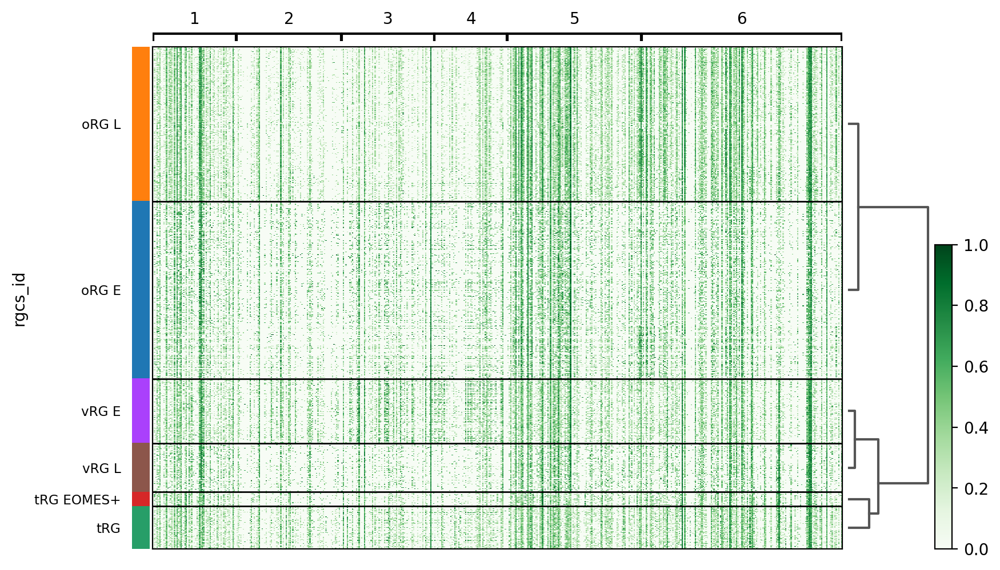

In [21]:
sc.tl.dendrogram(rgcs, var_names=prog_markers, 
                 groupby='rgcs_id', 
                 # groupby=rgcs_groupby,
                 optimal_ordering=True, use_raw=True)

sc.pl.heatmap(
    rgcs,
    var_names=prog_markers,
    groupby="rgcs_id", 
    gene_symbols='Gene.Symbols',
    cmap='Greens',
    layer='lognorm', 
    # layer='counts',
    # log=True,
    dendrogram=True,
    standard_scale='var', 
    use_raw=False)

In [22]:
# general_prog_df = sc.tl.marker_gene_overlap(rgcs, reference_markers=prog_markers_ensid,
#                                             method='overlap_coef', adj_pval_threshold=0.05)

# sns.clustermap(general_prog_df.T, col_cluster=False, figsize=(4,4), )

In [23]:
gene_pool = [x for y in list(prog_markers_ensid.values()) for x in y]

for k, v in prog_markers_ensid.items():
    sc.tl.score_genes(rgcs, gene_list=v, gene_pool=gene_pool, score_name=f'prog_{k}_score', use_raw=False)

computing score 'prog_1_score'
    finished: added
    'prog_1_score', score of gene set (adata.obs).
    456 total control genes are used. (0:00:01)
computing score 'prog_2_score'


/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'prog_2_score', score of gene set (adata.obs).
    396 total control genes are used. (0:00:00)
computing score 'prog_3_score'


/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'prog_3_score', score of gene set (adata.obs).
    405 total control genes are used. (0:00:00)
computing score 'prog_4_score'


/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'prog_4_score', score of gene set (adata.obs).
    384 total control genes are used. (0:00:00)
computing score 'prog_5_score'


/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'prog_5_score', score of gene set (adata.obs).
    418 total control genes are used. (0:00:00)
computing score 'prog_6_score'


/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'prog_6_score', score of gene set (adata.obs).
    368 total control genes are used. (0:00:00)


/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


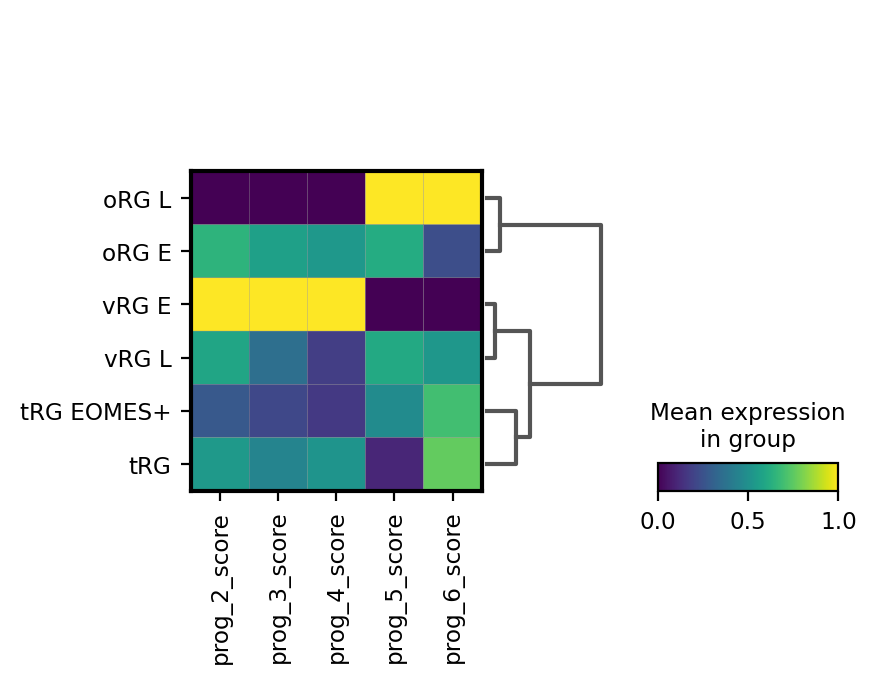

In [198]:
# del rgcs.uns['dendrogram_leiden_scVI_rgcs']
sc.pl.matrixplot(rgcs, [f'prog_{k}_score' for k in prog_markers_ensid.keys() if k!='1'], groupby='rgcs_id', dendrogram=True, standard_scale='var')

# Final annotation table

In [199]:
final_annotation_table = adata.obs[['Age', 'Cluster.LongName','Cluster.Name']].copy().assign(reannot = adata.obs_names.isin(nesc.obs_names), final_annotation=np.nan)

In [200]:
final_annotation_table['annotation_l1'] = nesc.obs['nesc_id'].reindex(final_annotation_table.index)
final_annotation_table['final_annotation'] = final_annotation_table[['annotation_l1', 'final_annotation']].apply(lambda x: x[1] if x.isna()[0] else x[0], axis=1)
# final_annotation_table['discarded_1'] = final_annotation_table['reannot'] & final_annotation_table['annotation_l1'].isna()

In [201]:
final_annotation_table['annotation_l2'] = rgcs.obs['rgcs_id'].reindex(final_annotation_table.index)
final_annotation_table['final_annotation'] = final_annotation_table[['annotation_l2', 'final_annotation']].apply(lambda x: x[1] if x.isna()[0] else x[0], axis=1)
# final_annotation_table['discarded_2'] = final_annotation_table['reannot'] & final_annotation_table['annotation_l2'].isna()

In [202]:
final_labels = {
    'vRG E': 'vRG E',
    'vRG L': 'vRG L',
    'tRG': 'tRG',
    'tRG EOMES+': 'tRG',
    'oRG E': 'oRG E',
    'oRG L': 'oRG L',
    
    'mGPC': 'mGPC',
    'Astro': 'Astro',
    'OPC': 'OPC',
    'Oligo': 'OPC',

    'nIPC': 'nIPC',
    'Neu E': 'Neu E',

    'GluN1': 'GluN1',
    'GluN2': 'GluN2',
    'GluN3': 'GluN3',
    'GluN4': 'GluN4',
    'GluN5': 'GluN5',
    'GluN6': 'GluN6',
    'GluN7': 'GluN7',
    'GluN8': 'GluN8',

}
final_annotation_table['final_labels'] = final_annotation_table['final_annotation'].replace(final_labels)

In [203]:
final_annotation_table.to_csv('./../data/final_annotation_table.tsv', sep='\t')

### Plots

<AxesSubplot: xlabel='Cluster.Name'>

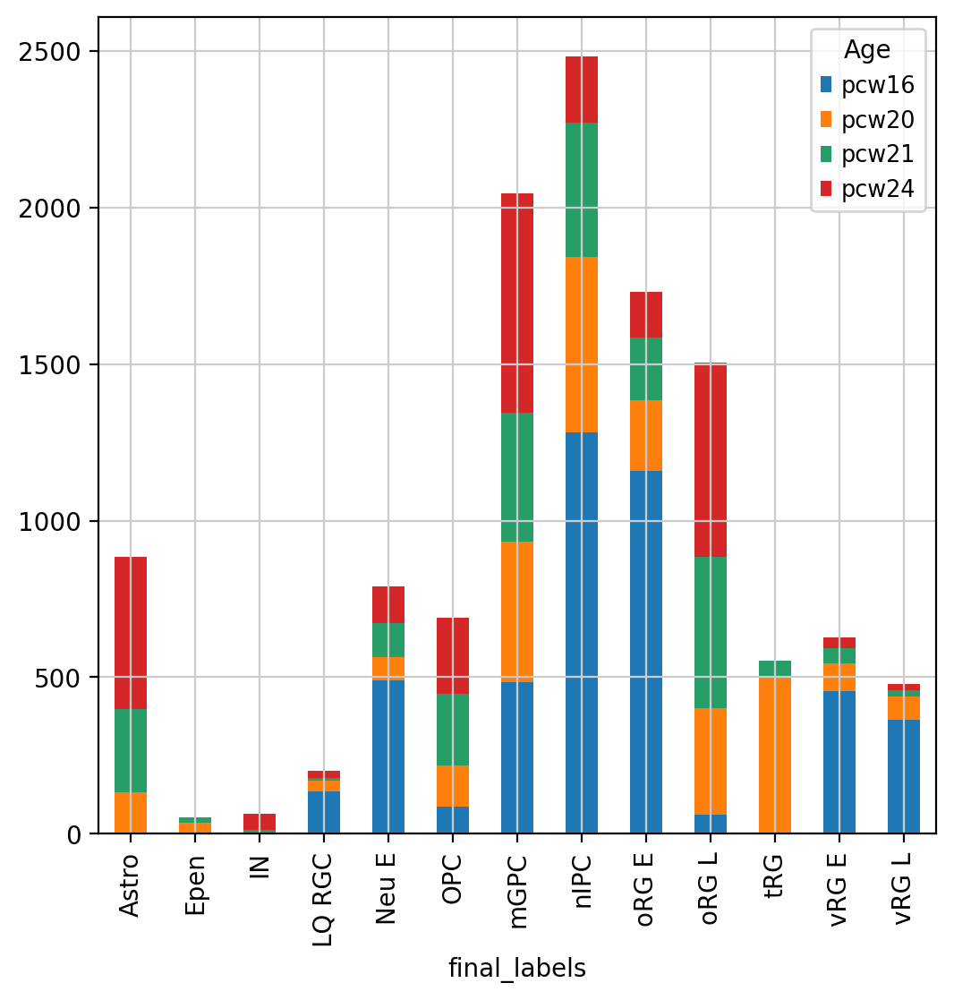

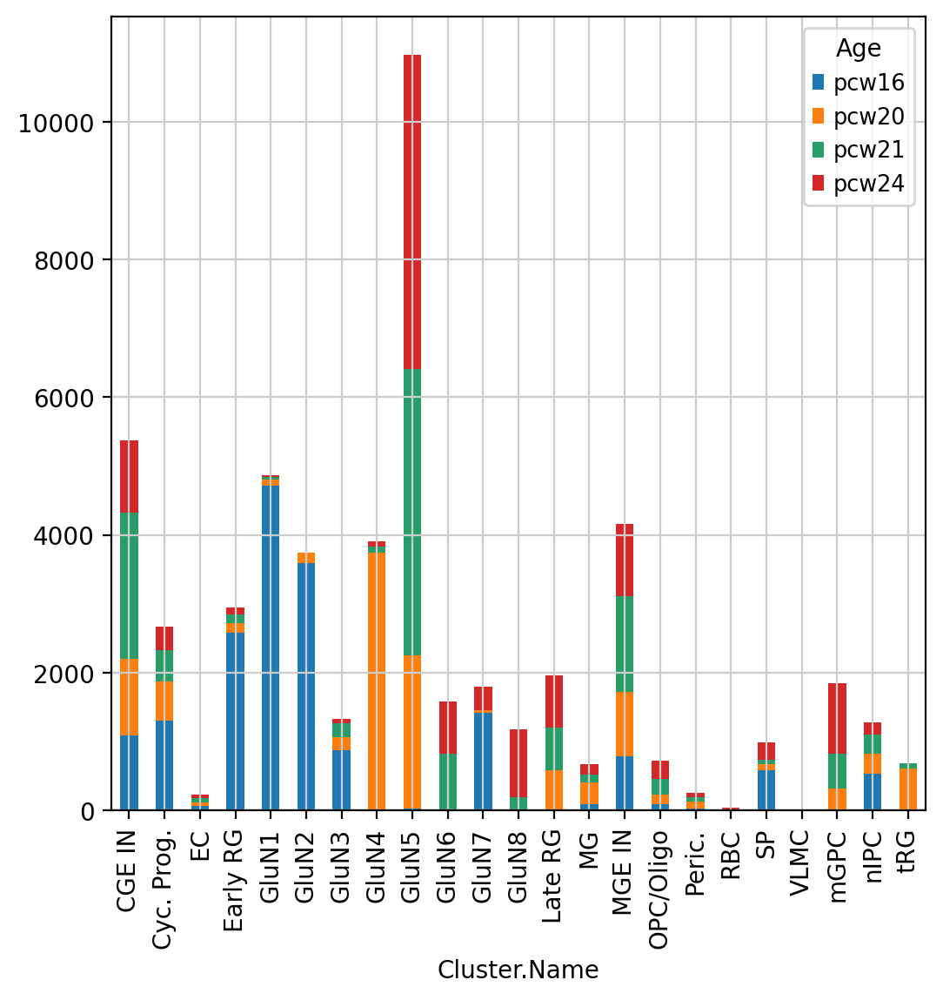

In [204]:
final_annotation_table.groupby('final_labels')['Age'].value_counts().unstack().plot.bar(stacked=True, 
                                                                                        # color={"speed": "red", "lifespan": "green"}
                                                                                       )
final_annotation_table.groupby('Cluster.Name')['Age'].value_counts().unstack().plot.bar(stacked=True, 
                                                                                        # color={"speed": "red", "lifespan": "green"}
                                                                                       )

In [205]:
import plotly.express as px

fig = px.parallel_categories(final_annotation_table[final_annotation_table['reannot']].drop('reannot', axis=1)[['Cluster.Name','final_annotation', 'final_labels']])
fig.write_html('./test.html')


fig = px.parallel_categories(final_annotation_table)
fig.write_html('./annot.sankey.html')


fig = px.parallel_categories(final_annotation_table[final_annotation_table['reannot']].drop('reannot', axis=1))
fig.write_html('./annot.sankey_reannot.html')


/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



# Export data

In [206]:
adata.write_h5ad('./../data/export_scvi_data.h5ad')
nesc.write_h5ad('./../data/export_scvi_nesc.h5ad')
rgcs.write_h5ad('./../data/export_scvi_rgcs.h5ad')

# Export plots

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [11]:
%matplotlib inline

In [12]:
adata = sc.read_h5ad('./../data/export_scvi_data.h5ad', backed=True)
nesc = sc.read_h5ad('./../data/export_scvi_nesc.h5ad', backed=True)
rgcs = sc.read_h5ad('./../data/export_scvi_rgcs.h5ad', backed=True)

In [19]:
export_markers = {k: v for k,v in all_markers_nesc.items() if k in ['Cycling progenitors', 'Radial glia', 'Early radial glia', 'Late radial glia', 'Ventricular radial glia', 'Truncated radial glia', 'Ependymal', 'Outer radial glia', 'mGPC', 'Astrocytes', 'OPC Oligo', 'nIPC', 'Early neurons', 'Cortical interneurons']}

In [20]:
ordered = [ 
 'vRG E',
 'vRG L',
 'tRG',
 'tRG EOMES+',
 'Epen',
 'oRG E',
 'oRG L',
 'nIPC',
 'Neu E',
 'IN',
 'mGPC',
 'Astro',
 'OPC',
 'Oligo',
 'LQ RGC'
]
ct_palette = ['#25795d','#fd8f4a','#eeb32a','#256951','#ac5b53','#e07f41','#fda642','#c70d2d','#b52141','#2b7ab3','#45195c','#44253d','#153268']

In [27]:
clusters_palette = {'Cyc. Prog.':'#EFDC60','Early RG':'#FEA090','Late RG':'#E0607E','tRG':'#8E2043','nIPC':'#0A9086','mGPC':'#59C7EB','OPC/Oligo':'#3E5496'}

In [21]:
final_annotation_table = pd.read_csv('../data/final_annotation_table.tsv', sep='\t', index_col=0)

In [22]:
adata.obs['final_annotation'] = pd.Categorical(final_annotation_table['final_annotation'].loc[adata.obs_names], ordered)

In [23]:
adata.uns['final_annotation_colors'] = ct_palette[:len(adata.obs['final_annotation'].unique())]
adata.uns['Age_colors'] =  ['#51127C','#B63679','#FB8861','#FCFDBF'] #[sc.pl.palettes.colors.rgb2hex(c) for c in sc.pl.palettes.cm.magma([.25,.50,.75,1])]

In [24]:
adata.obs['Cluster.Name'] = adata.obs['Cluster.Name'].astype('category')

In [30]:
adata.uns['Cluster.Name_colors'] = ['black']*adata.obs['Cluster.Name'].nunique()

for i, k in enumerate(adata.obs['Cluster.Name'].cat.categories):
    if k in clusters_palette.keys():
        adata.uns['Cluster.Name_colors'][i] = clusters_palette[k]

/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No 

/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


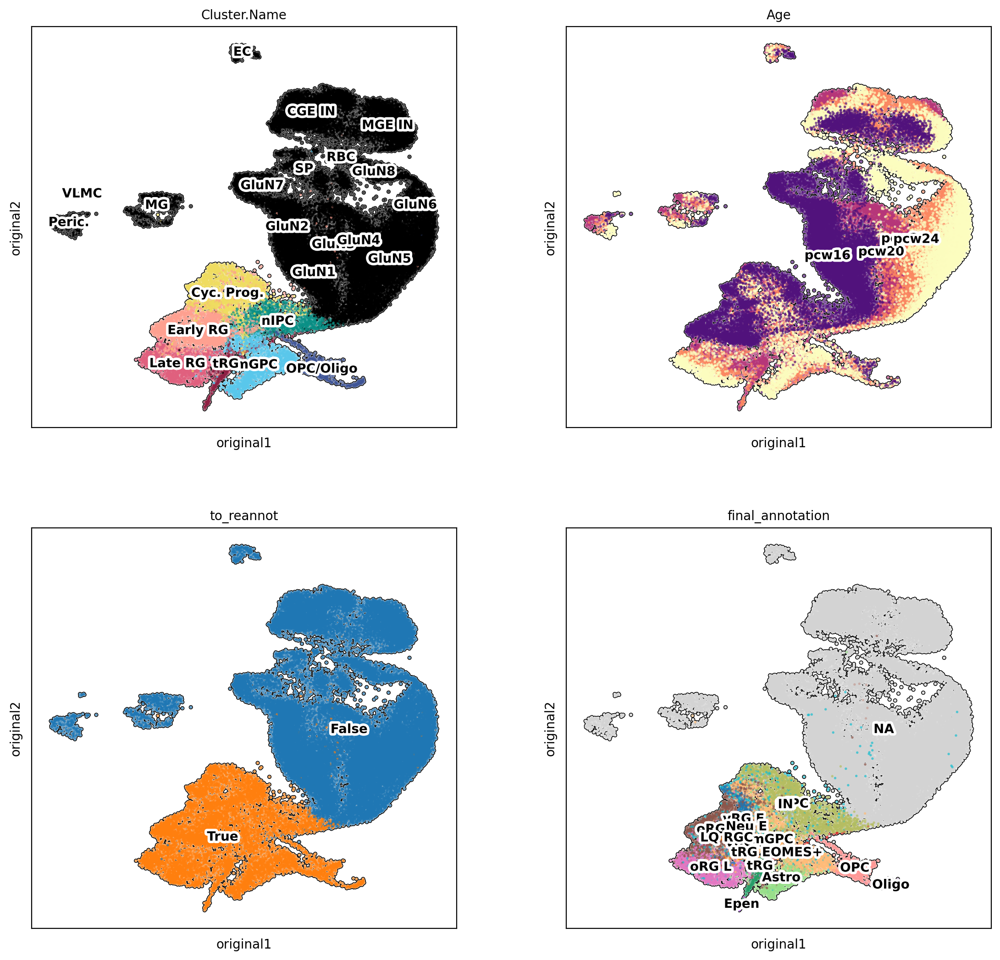

/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No 

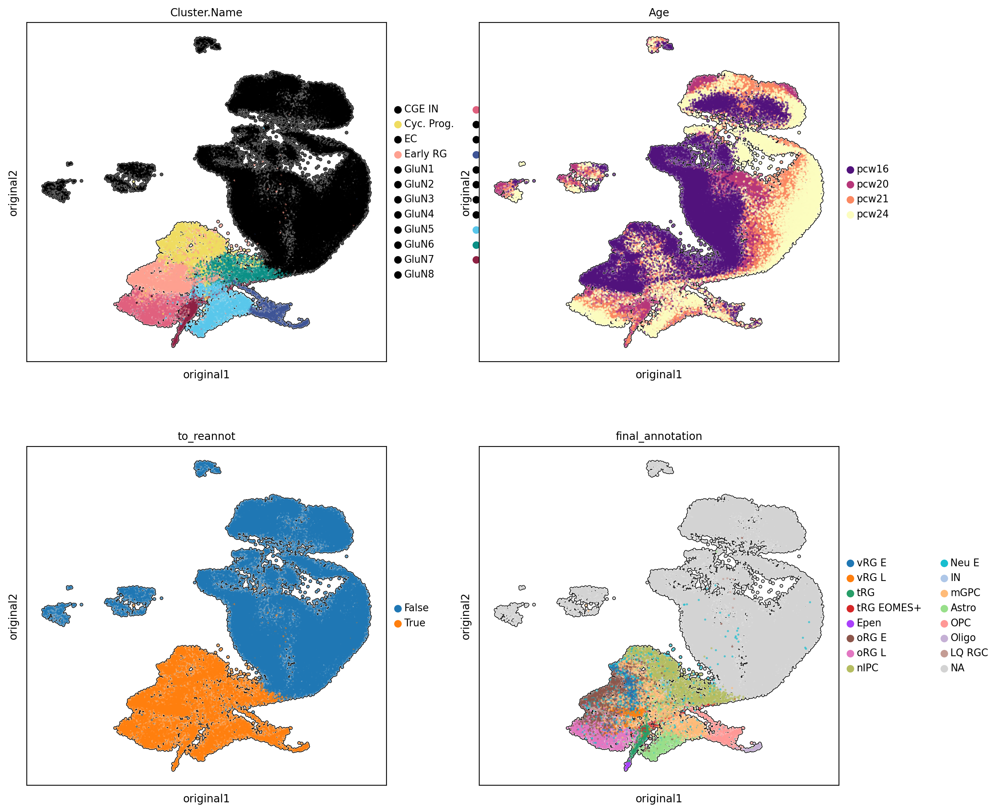

In [31]:
sc.pl.embedding(adata, color=['Cluster.Name', 'Age', 'to_reannot', 'final_annotation'], basis='original',
                legend_loc='on data', 
                legend_fontoutline=4,
                alpha=0.7,
                ncols=2,
                save='_clusters_reannot.on_data.pdf',
                add_outline=True, size=15)
sc.pl.embedding(adata, color=['Cluster.Name', 'Age', 'to_reannot', 'final_annotation'], basis='original',
                # legend_loc='on data', 
                legend_fontoutline=4,
                alpha=0.7,
                ncols=2,
                save='_clusters_reannot.pdf',
                add_outline=True, size=15)

In [32]:
nesc.obs['final_annotation'] = pd.Categorical(final_annotation_table['final_annotation'].loc[nesc.obs_names], categories=ordered)

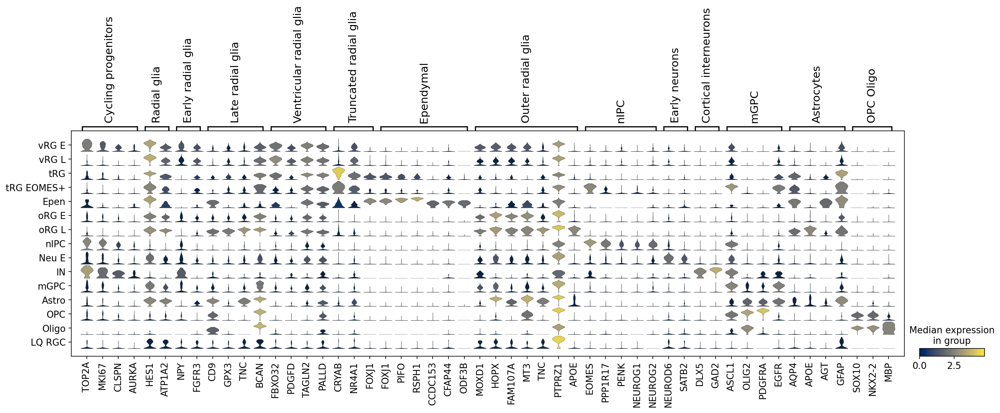

In [33]:
# del nesc.uns['dendrogram_final_labels']
sc.set_figure_params(figsize=(15,10))
sc.pl.stacked_violin(
    nesc,
    var_names=export_markers,
    groupby='final_annotation', 
    gene_symbols='Gene.Symbols',
    cmap='cividis',
    layer='lognorm', 
    dendrogram=False,
    # standard_scale='var', 
    save='_annotation_markers_final_annotation.pdf',
    # return_fig=True,
    # swap_axes=True,
    show=True,
    # log=True,
    use_raw=False)

In [37]:
nesc.obs['final_annotation']

Cell.ID
hft_w20_p3_r1_AAACCCAAGGTAGTAT    Astro
hft_w20_p3_r1_AAACCCACAACTCCAA      OPC
hft_w20_p3_r1_AAACCCAGTACTCGCG    oRG L
hft_w20_p3_r1_AAACCCATCTGTCAGA     nIPC
hft_w20_p3_r1_AAACGAACAGACCTGC      OPC
                                  ...  
hft_w16_p7_r2_TTTGGTTGTAGGGAGG     nIPC
hft_w16_p7_r2_TTTGGTTTCCCTTTGG    vRG E
hft_w16_p7_r2_TTTGTTGCAATTCGTG     nIPC
hft_w16_p7_r2_TTTGTTGCAGCACCCA     mGPC
hft_w16_p7_r2_TTTGTTGGTTAGTTCG    oRG E
Name: final_annotation, Length: 12102, dtype: category
Categories (15, object): ['vRG E', 'vRG L', 'tRG', 'tRG EOMES+', ..., 'Astro', 'OPC', 'Oligo', 'LQ RGC']

In [34]:
nesc.uns['leiden_scVI_colors'] = sc.pl.palettes.default_28
nesc.uns['final_annotation_colors'] = ct_palette[:len(nesc.obs['final_annotation'].unique())]
nesc.uns['Age_colors'] = ['#51127C','#B63679','#FB8861','#FCFDBF'] #[sc.pl.palettes.colors.rgb2hex(c) for c in sc.pl.palettes.cm.magma([.25,.50,.75,1])]
nesc.uns['Cluster.Name_colors'] = [clusters_palette[k] for k in nesc.obs['Cluster.Name'].cat.categories]

/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No 

/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


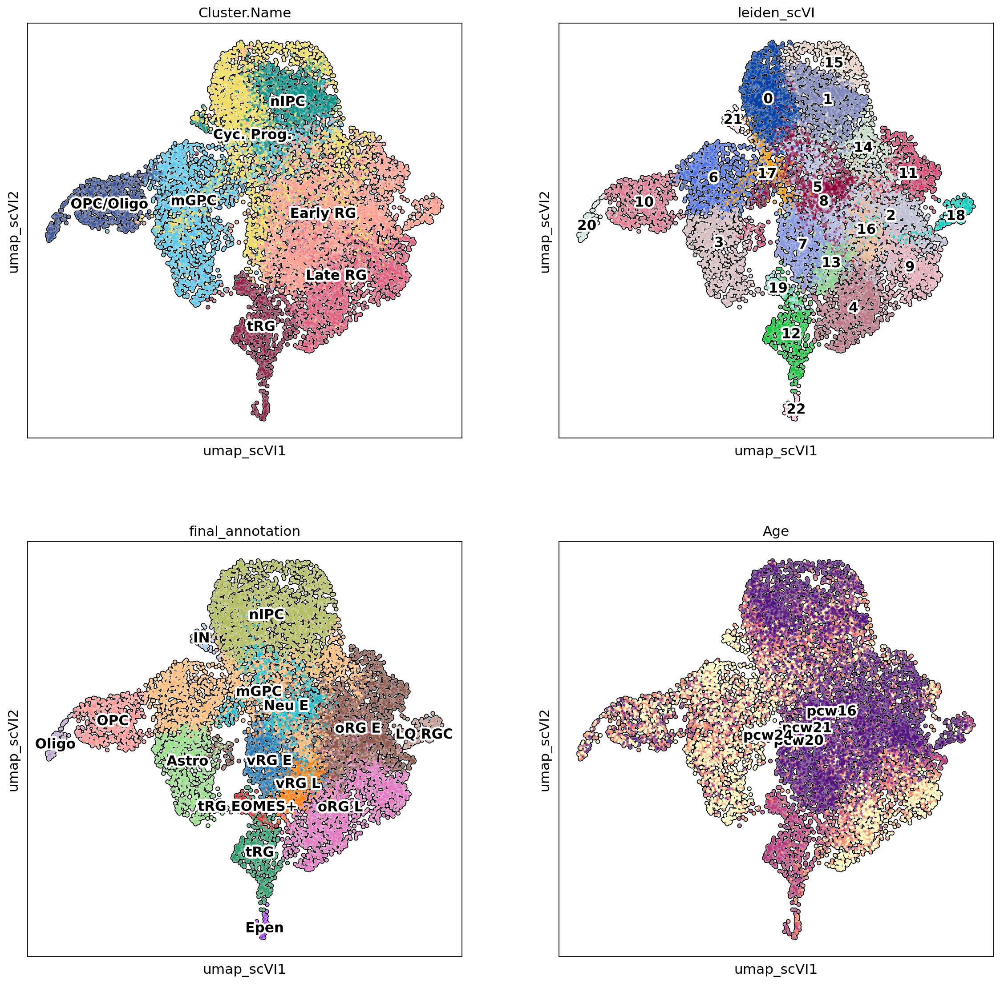

/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/users/genomics/xoel/codebases/scvi/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No 

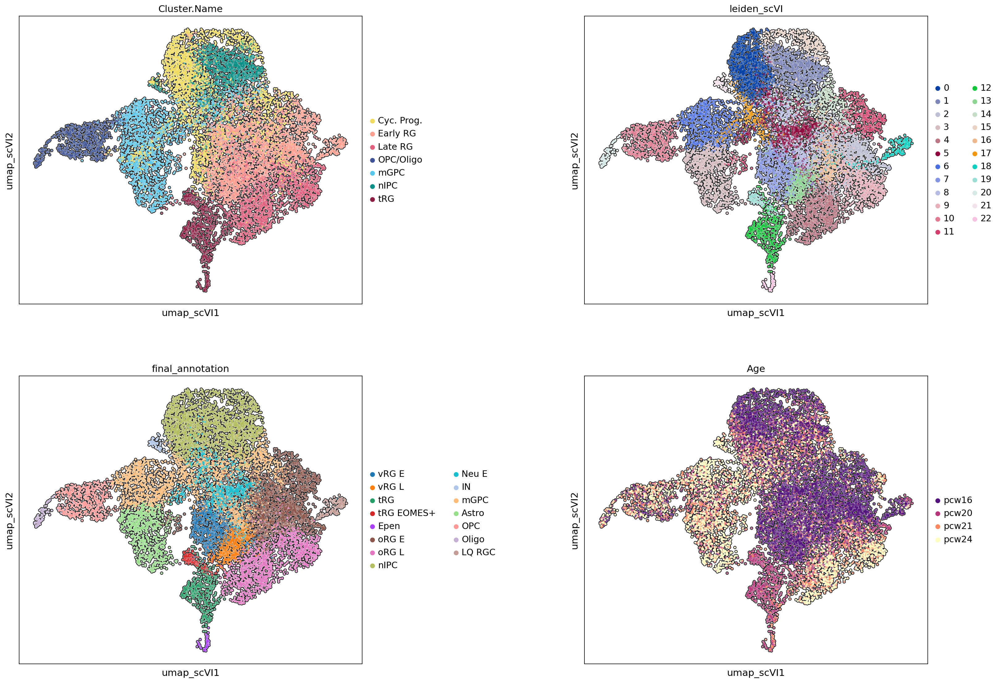

In [39]:
sc.set_figure_params(figsize=(8,8))
sc.pl.embedding(nesc, basis='umap_scVI', 
                color=['Cluster.Name', 'leiden_scVI', 'final_annotation', 'Age'],
                legend_loc='on data', 
                legend_fontoutline=4,
                alpha=0.7,
                ncols=2,
                save='_clusters_final_annotation_age.on_data.pdf',
                add_outline=True, size=30)

sc.set_figure_params(figsize=(8,8))
sc.pl.embedding(nesc, basis='umap_scVI', 
                color=['Cluster.Name', 'leiden_scVI', 'final_annotation', 'Age'],
                # legend_loc='on data', 
                wspace=.5,
                legend_fontoutline=4,
                alpha=0.7,
                ncols=2,
                save='_clusters_final_annotation_age.pdf',
                add_outline=True, size=30)

In [ ]:
# del rgcs.uns['dendrogram_leiden_scVI_rgcs']
sc.set_figure_params(figsize=(12,12))
sc.pl.stacked_violin(rgcs, [f'prog_{k}_score' for k in prog_markers_ensid.keys()],   
                     save='_RG_progression.pdf',
                     groupby='rgcs_id', dendrogram=True, standard_scale='var')